In [1]:
import cv2
import numpy as np
import pandas as pd
from PIL import Image
import os
from tqdm import tqdm
import os
from matplotlib import pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras import mixed_precision

tf.config.optimizer.set_jit(True)

mixed_precision.set_global_policy('mixed_float16')

os.chdir('/home/jack/Documents/kona_coffee')

#data_path = '/home/jack/Mounts/DiskOne/kona_coffee/rust_dataset'
data_path = '/home/jack/Documents/kona_coffee/rust_dataset'

df = pd.read_csv('/home/jack/Documents/kona_coffee/classified.csv')
#df = pd.read_csv('classified.csv')

os.makedirs(data_path, exist_ok=True)
os.makedirs(os.path.join(data_path, 'normal'), exist_ok=True)
os.makedirs(os.path.join(data_path, 'rust'), exist_ok=True)

df

2023-12-11 21:06:28.722409: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-11 21:06:30.041852: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3060, compute capability 8.6


,path,x,y,size,rust
0,/home/jack/Mounts/RemoteS3/kona_coffee_images/...,0,0,64,0
1,/home/jack/Mounts/RemoteS3/kona_coffee_images/...,64,0,64,0
2,/home/jack/Mounts/RemoteS3/kona_coffee_images/...,128,0,64,0
3,/home/jack/Mounts/RemoteS3/kona_coffee_images/...,192,0,64,0
4,/home/jack/Mounts/RemoteS3/kona_coffee_images/...,256,0,64,0
...,...,...,...,...,...
41081,/home/jack/Mounts/RemoteS3/kona_coffee_images/...,1728,2304,64,1
41082,/home/jack/Mounts/RemoteS3/kona_coffee_images/...,1792,2304,64,1
41083,/home/jack/Mounts/RemoteS3/kona_coffee_images/...,1728,2432,64,1
41084,/home/jack/Mounts/RemoteS3/kona_coffee_images/...,2560,2432,64,1


In [2]:
image_paths = df['path'].unique()

image_cache = {}

for path in tqdm(image_paths):
    image_cache[path] = Image.open(path)

print(f'Loaded {len(image_cache)} images.')

100%|██████████| 16/16 [00:24<00:00,  1.54s/it]

Loaded 16 images.


In [3]:
counts = df['rust'].value_counts()

lowest = min(counts)

df = df.groupby('rust').sample(lowest, random_state=42, replace=True)

df['rust'].value_counts()

0    5866
1    5866
Name: rust, dtype: int64

In [4]:
import torch
from torchvision import transforms

torch.manual_seed(17)

def get_transformer():
    return torch.nn.Sequential(
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.0),
        transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
        transforms.RandomAdjustSharpness(sharpness_factor=2.0, p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomHorizontalFlip(p=0.5),
    )
    
def crop(image_path, x, y, size):
    x1, x2 = x, x + size
    y1, y2 = y, y + size
    return np.array(image_cache[image_path].crop((x1, y1, x2, y2)))

transformer = get_transformer()

loader = tqdm(total=len(df))

for index, row in df.iterrows():
    class_name = 'normal' if row['rust'] == 0 else 'rust'

    cropped = crop(row['path'], row['x'], row['y'], row['size'])
    path = os.path.join(data_path, class_name, f'{index}.png')
    cv2.imwrite(path, cropped)

    for i in range(5):
        transformed = np.array(transformer(Image.fromarray(cropped)))
        path = os.path.join(data_path, class_name, f'{index}_{i}.png')
        cv2.imwrite(path, transformed)

    loader.update(1)

loader.close()

100%|██████████| 11732/11732 [01:57<00:00, 100.18it/s]


In [37]:
batch_size = 256

train_ds, test_ds = tf.keras.utils.image_dataset_from_directory(
    data_path,
    subset="both",
    validation_split=0.2,
    seed=123,
    image_size=(64, 64),
    batch_size=batch_size,
    labels='inferred',
    label_mode='categorical',
)

# take 10% of the training data for validation
validation_ds = train_ds.take(int(0.1 * len(train_ds)))

# remove validation data from training data
train_ds = train_ds.skip(int(0.1 * len(train_ds)))

# print total number of training images
print(f'Total training images: {len(train_ds) * batch_size}')
print(f'Total validation images: {len(validation_ds) * batch_size}')
print(f'Total test images: {len(test_ds) * batch_size}')

AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
validation_ds = validation_ds.cache().prefetch(buffer_size=AUTOTUNE)

Found 54612 files belonging to 2 classes.
Using 43690 files for training.
Using 10922 files for validation.
Total training images: 39424
Total validation images: 4352
Total test images: 11008


In [34]:
def graph_history_metrics(history):
    cols = 3
    rows = int(np.ceil(len(history.history.keys()) / cols))
    
    height = 5 * rows

    fig, axes = plt.subplots(rows, cols, figsize=(20, height))
    axes = axes.flatten()

    # pad the axes
    fig.tight_layout(pad=3.0)

    fig.suptitle('Model Metrics')

    keys = history.history.keys()

    for i, key in enumerate(keys):
        
        final_val = history.history[key][-1]
        
        axes[i].axhline(final_val, ls='--', color='r')
        axes[i].plot(history.history[key], label=key)
        axes[i].set_title(f'{key}. Final: {final_val:.4f}')
        axes[i].set_xlabel('Epoch')
        axes[i].set_ylabel(key)
        axes[i].legend()


0epoch [00:00, ?epoch/s]

2023-12-11 21:32:43.243492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [43690]
	 [[{{node Placeholder/_4}}]]
2023-12-11 21:32:43.243997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [43690]
	 [[{{node Placeholder/_4}}]]
2023-12-11 21:32:48.470975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [43690

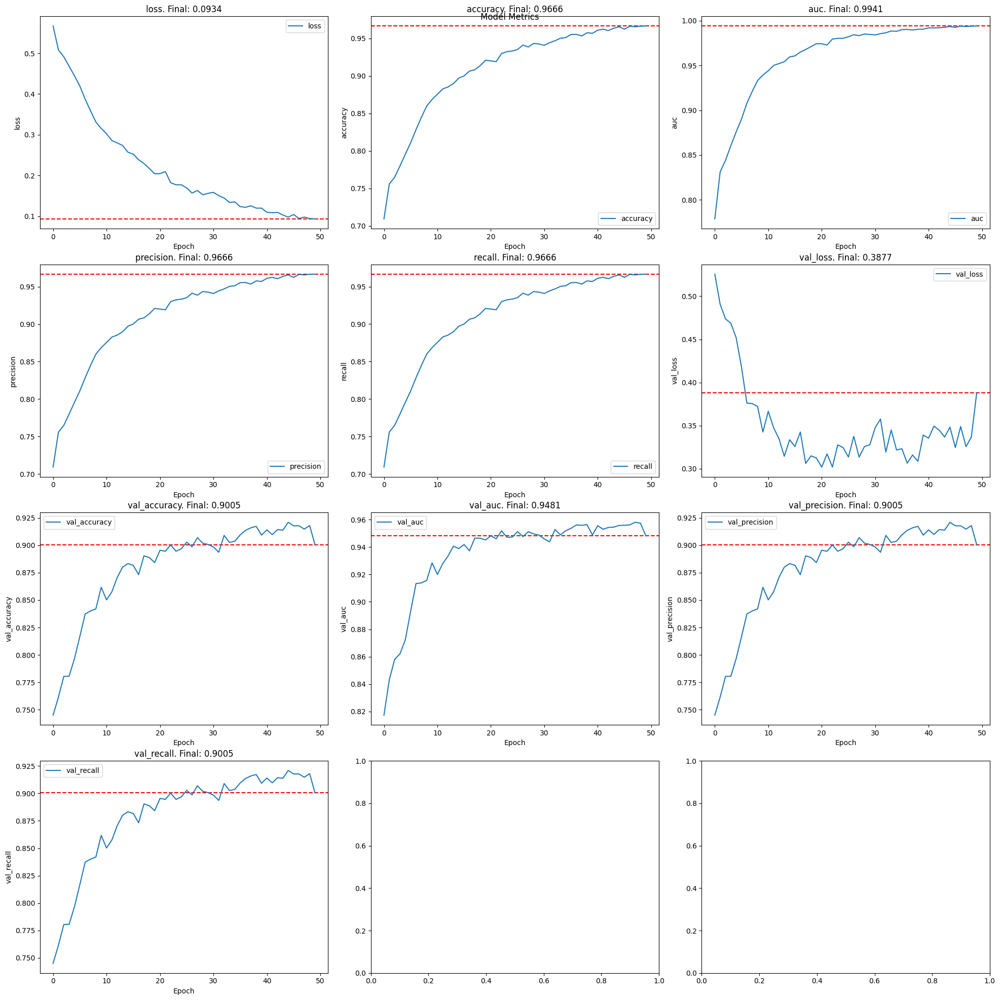

In [38]:
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Activation, Rescaling, Dropout
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from tqdm.keras import TqdmCallback
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold


model = Sequential()
model.add(Rescaling(1./255, input_shape=(64, 64, 3)))
model.add(Conv2D(32, (5, 5), activation='relu', input_shape=(64, 64, 3)))
model.add(MaxPooling2D((2, 2)))
#model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(32, activation='relu'))
model.add(Dense(2, activation=Activation('softmax', dtype='float32', name='predictions')))
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy', 'AUC', 'Precision', 'Recall']
)

history = model.fit(
    train_ds,
    validation_data=validation_ds,
    epochs=50,
    verbose=0,
    callbacks=[
        TqdmCallback(verbose=0),
        #EarlyStopping(monitor='val_loss', patience=30
    ]
)

graph_history_metrics(history)

# print(classification_report(
#     test_ds.classes,
#     model.predict(test_ds).argmax(axis=1),
#     labels=[0, 1],
#     target_names=['normal', 'rust']
# ))

In [39]:
# get true y from _BatchDataset
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_true = y_true.argmax(axis=1)

print(classification_report(
    y_true,
    model.predict(test_ds).argmax(axis=1),
    #labels=[0, 1],
    target_names=['normal', 'rust']
))

2023-12-11 21:34:59.132927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [10922]
	 [[{{node Placeholder/_4}}]]
2023-12-11 21:34:59.133323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [10922]
	 [[{{node Placeholder/_4}}]]


43/43 [==============================] - 1s 10ms/step
              precision    recall  f1-score   support

      normal       0.87      0.95      0.91      6511
        rust       0.91      0.80      0.85      4411

    accuracy                           0.89     10922
   macro avg       0.89      0.87      0.88     10922
weighted avg       0.89      0.89      0.88     10922



In [16]:
# export model
model.save('rust_model.h5')

In [26]:
#import keras
#model = keras.models.load_model('rust_model.h5')

path = '/home/jack/Mounts/RemoteS3/kona_coffee_images/leaves/03-12-2023'
image_paths = os.listdir(path)

random_images = np.random.choice(image_paths, 20)
random_images = [Image.open(os.path.join(path, image_path)).convert('RGB') for image_path in random_images]

Cropping: 0.36
Predicting: 0.85
Creating heatmap: 0.05
Total coverage: 0.00
Gaussian filter: 0.21
Applying heatmap: 0.31


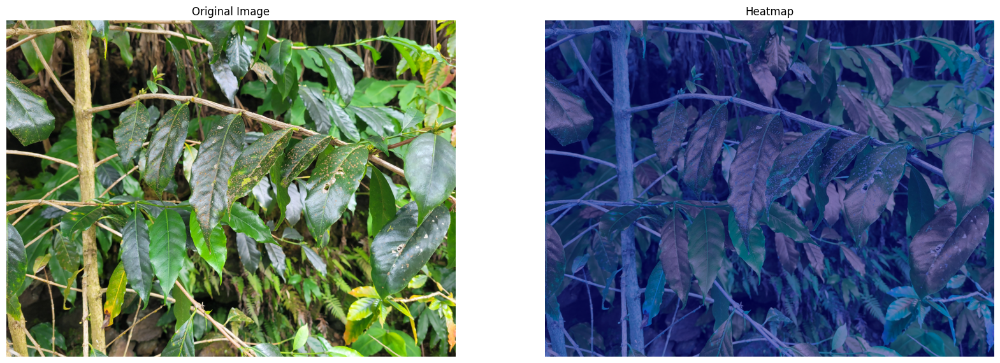

Cropping: 0.20
Predicting: 0.44
Creating heatmap: 0.05
Total coverage: 0.00
Gaussian filter: 0.21
Applying heatmap: 0.31


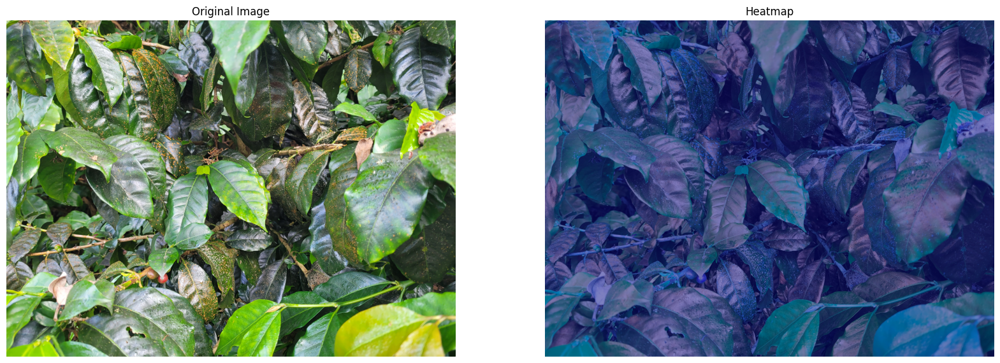

Cropping: 0.21
Predicting: 0.45
Creating heatmap: 0.05
Total coverage: 0.00
Gaussian filter: 0.21
Applying heatmap: 0.31


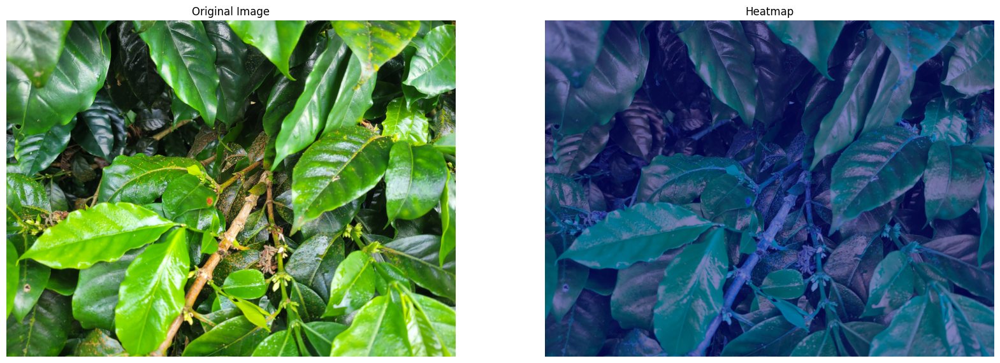

Cropping: 0.19
Predicting: 0.45
Creating heatmap: 0.05
Total coverage: 0.00
Gaussian filter: 0.21
Applying heatmap: 0.31


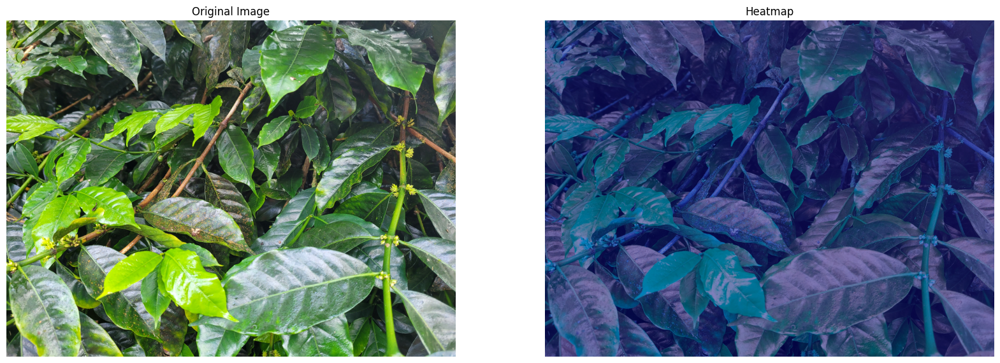

Cropping: 0.20
Predicting: 0.45
Creating heatmap: 0.05
Total coverage: 0.00
Gaussian filter: 0.21
Applying heatmap: 0.31


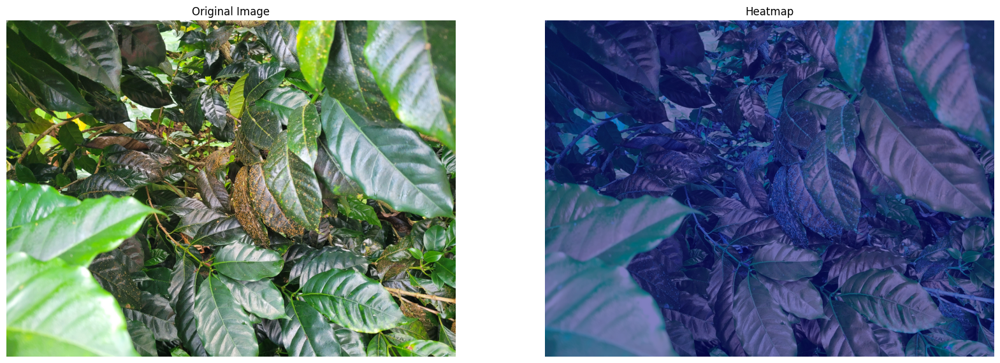

Cropping: 0.20
Predicting: 0.43
Creating heatmap: 0.04
Total coverage: 0.00
Gaussian filter: 0.21
Applying heatmap: 0.31


KeyboardInterrupt: 

In [40]:
import time

def estimate_rust(image):
    box_size = 64
    x = 0
    y = 0

    start_time = time.perf_counter()
    cropped = []
    while y < image.height:
        while x < image.width:
            crop = image.crop((x, y, x + box_size, y + box_size))
            crop = np.array(crop) / 255.0
            cropped.append((crop, x, y, box_size))
            x += box_size
        y += box_size
        x = 0
    print(f'Cropping: {time.perf_counter() - start_time:.2f}')

    start_time = time.perf_counter()
    input = np.stack([crop[0] for crop in cropped])    
    results = model.predict(input, verbose=0, batch_size=len(cropped))
    print(f'Predicting: {time.perf_counter() - start_time:.2f}')
    start_time = time.perf_counter()
    
    heatmap = np.zeros((image.height, image.width))
    total_coverage = 0
    for index, row in enumerate(cropped):
        x = int(row[1])
        y = int(row[2])
        size = int(row[3])
        rust = results[index][1]
        heatmap[y:y + size, x:x + size] = rust
        total_coverage += rust
    print(f'Creating heatmap: {time.perf_counter() - start_time:.2f}')
    print(f'Total coverage: {total_coverage:.2f}')
    
    start_time = time.perf_counter()
    cv2image = np.array(image)
    
    step_start = time.perf_counter()
    
    heatmap = np.stack([heatmap] * 3, axis=-1)
    heatmap = (heatmap * 255).astype(np.uint8)
    
    # guassian filter with opencv
    #cv2.GaussianBlur(heatmap, heatmap, (63,63), cv2.BORDER_DEFAULT)
    #heatmap = cv2.medianBlur(heatmap, 64+64-1)
    #heatmap = cv2.filter2D(heatmap, -1, np.ones((5,5),np.float32)/25)
    #heatmap = cv2.blur(heatmap, (64*2,64*2))
    
    #heatmap = gaussian_filter(heatmap, sigma=box_size)
    print(f'Gaussian filter: {time.perf_counter() - step_start:.2f}')
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    #heatmap = cv2.addWeighted(heatmap, 0.5, cv2image, 0.5, 0)
    
    # apply the heatmap without much blending
    heatmap = cv2.addWeighted(heatmap, 0.5, cv2image, 0.5, 0)
    
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    print(f'Applying heatmap: {time.perf_counter() - start_time:.2f}')
    
    return cv2image, heatmap
    
for random_image in random_images:
    cv2image, heatmap = estimate_rust(random_image)
    
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    ax[0].imshow(cv2image)
    ax[0].axis('off')
    ax[0].set_title('Original Image')
    ax[1].imshow(heatmap)
    ax[1].axis('off')
    ax[1].set_title('Heatmap')
    plt.show()
